In [ ]:
!pip install autotrain-advanced

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.1/213.1 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.1/174.1 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 520.4/520.4 kB 41.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.9/72.9 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 19.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 27.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.2/404.2 kB 35.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 50.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 304.5/304.5 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 880.6/880.6 kB 28.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━

In [ ]:
from diffusers import DiffusionPipeline
import torch

pipeline = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16
).to("cuda")
pipeline.load_lora_weights("Bilal326/ND_AutoTrain_LoRA", weight_name="pytorch_lora_weights.safetensors")
pipeline.fuse_lora(lora_scale=0.7)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/2.78G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

tokenizer_2/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/10.3G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

pytorch_lora_weights.safetensors:   0%|          | 0.00/23.4M [00:00<?, ?B/s]

In [ ]:
from diffusers import DiffusionPipeline, StableDiffusionXLImg2ImgPipeline

In [ ]:
# refiner = StableDiffusionXLImg2ImgPipeline.from_pretrained(
#     "stabilityai/stable-diffusion-xl-refiner-1.0",
#     torch_dtype=torch.float16,
# )
# refiner.to("cuda")

In [ ]:
prompt = "The sun becoming a supernova and burning the skies as the clouds part upon the last survivor of a pagan ritual that worships sks who is the goddess of the moon, in the style of Ashley wood, moody composition and colors, detail, sharp focus, intricate, cinematic, surreal, accepted, epic, excellent, artistic, highly detailed, dynamic, still, great light, majestic"

for seed in range(10):
    generator = torch.Generator("cuda").manual_seed(seed)
    image = pipeline(prompt=prompt, generator=generator, num_inference_steps=25)
    image = image.images[0]
    image.save(f"/content/sks_woman/{seed}.png")
    # image = refiner(prompt=prompt, generator=generator, image=image)
    # image = image.images[0]
    # image.save(f"/content/sks_woman_refined/{seed}.png")

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

In [ ]:
# import torch
# torch.cuda.empty_cache()

In [ ]:
!zip -r /content/sks_woman.zip /content/sks_woman


  adding: content/sks_woman/ (stored 0%)
  adding: content/sks_woman/6.png (deflated 0%)
  adding: content/sks_woman/4.png (deflated 0%)
  adding: content/sks_woman/3.png (deflated 0%)
  adding: content/sks_woman/1.png (deflated 0%)
  adding: content/sks_woman/7.png (deflated 0%)
  adding: content/sks_woman/0.png (deflated 0%)
  adding: content/sks_woman/5.png (deflated 0%)
  adding: content/sks_woman/8.png (deflated 0%)
  adding: content/sks_woman/9.png (deflated 0%)
  adding: content/sks_woman/2.png (deflated 0%)


In [ ]:
!pip install Pillow


<ipython-input-16-6b44f1f7a620>:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((width, height), Image.ANTIALIAS)


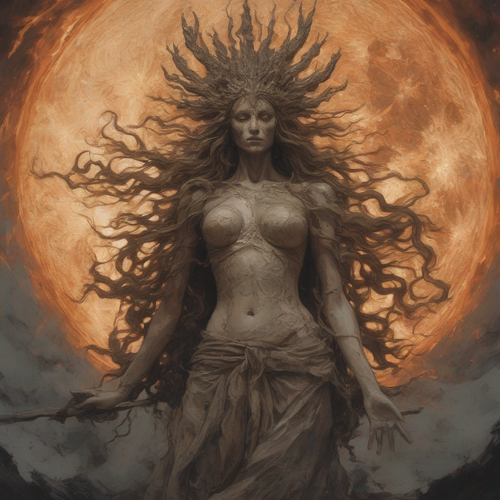

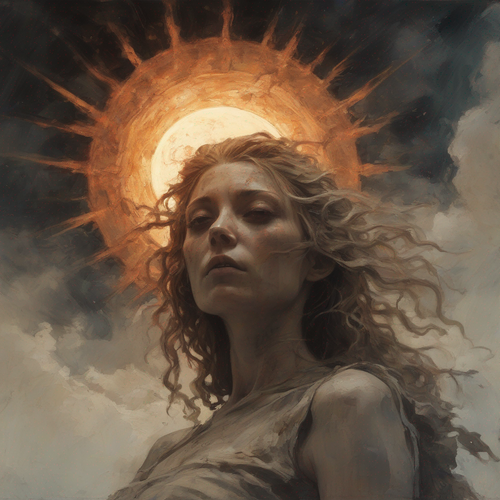

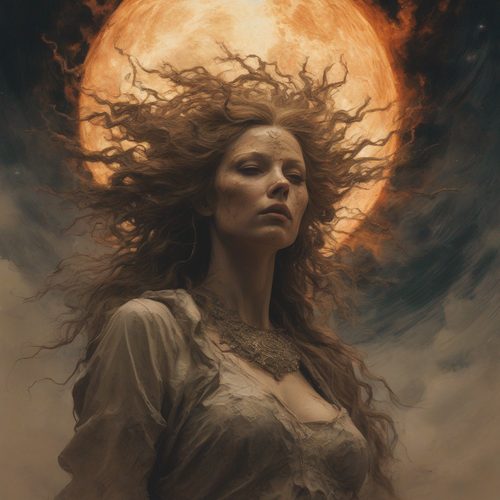

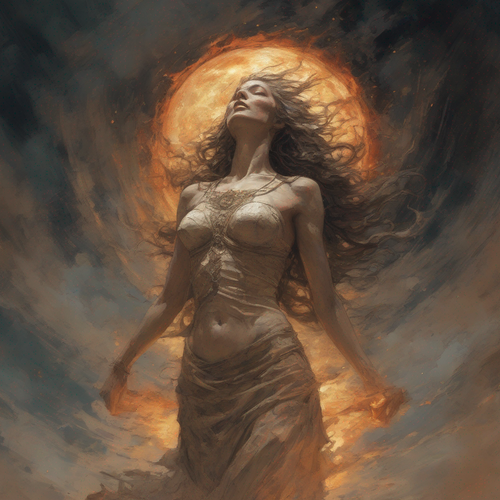

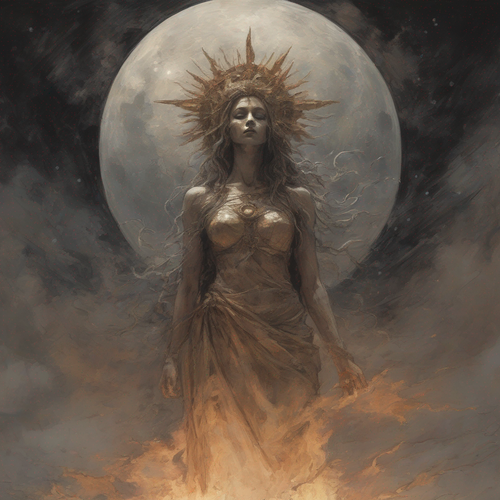

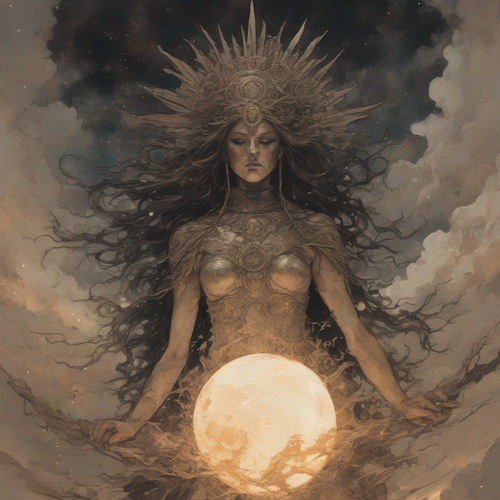

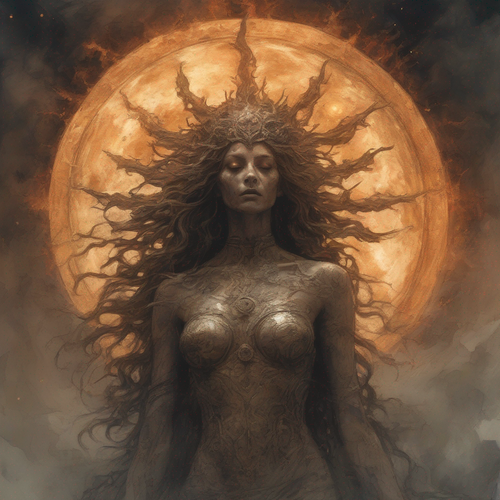

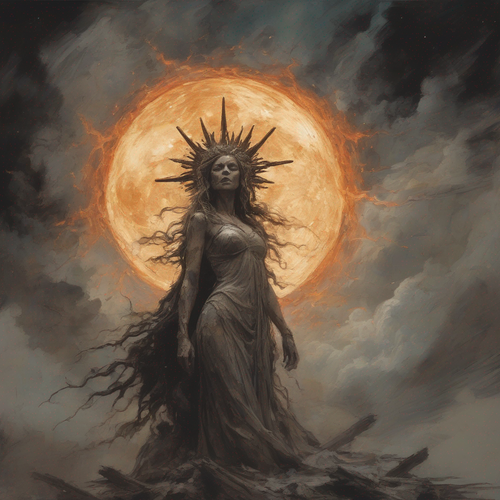

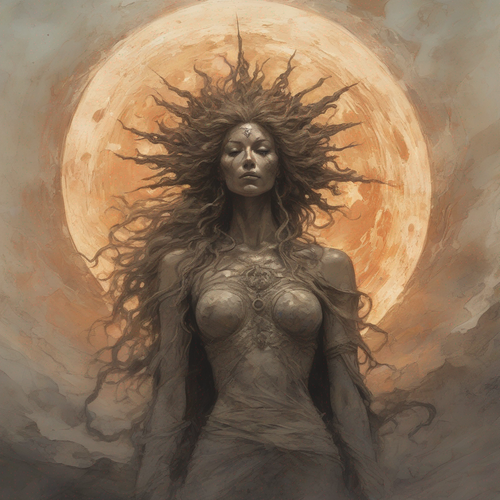

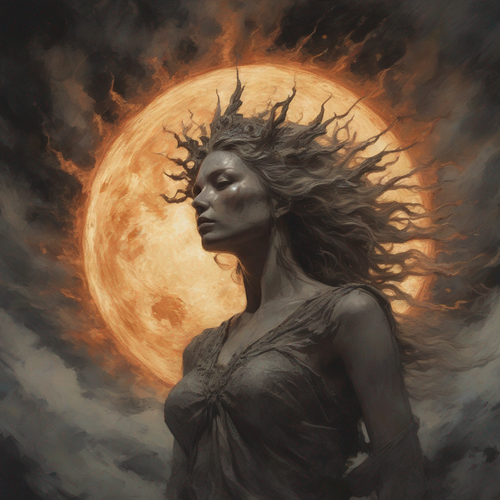

In [ ]:
from PIL import Image
from IPython.display import display
import os

path = "/content/sks_woman"

# Set the size to which you want to scale the images
width, height = 500, 500  # Example dimensions

for i in range(10):
    file_path = os.path.join(path, f'{i}.png')
    if os.path.exists(file_path):
        img = Image.open(file_path)
        img = img.resize((width, height), Image.ANTIALIAS)
        display(img)


In [19]:
prompt = "sks woman with dark brown hair in ancient greece, game of thrones theme"

for seed in range(10):
    generator = torch.Generator("cuda").manual_seed(seed)
    image = pipeline(prompt=prompt, generator=generator, num_inference_steps=25)
    image = image.images[0]
    image.save(f"/content/sks_woman3/{seed}.png")
    # image = refiner(prompt=prompt, generator=generator, image=image)
    # image = image.images[0]
    # image.save(f"/content/sks_woman_refined/{seed}.png")

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

<ipython-input-20-c070f81d74f3>:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((width, height), Image.ANTIALIAS)


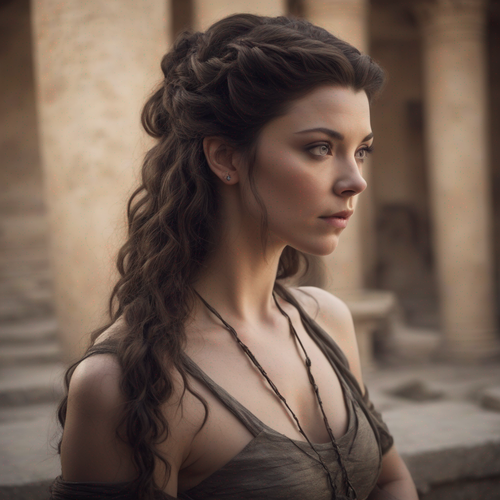

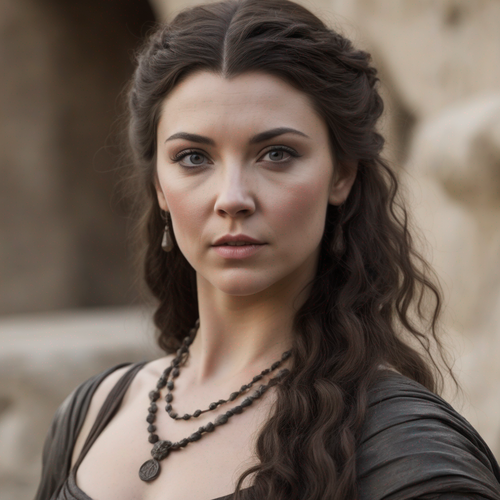

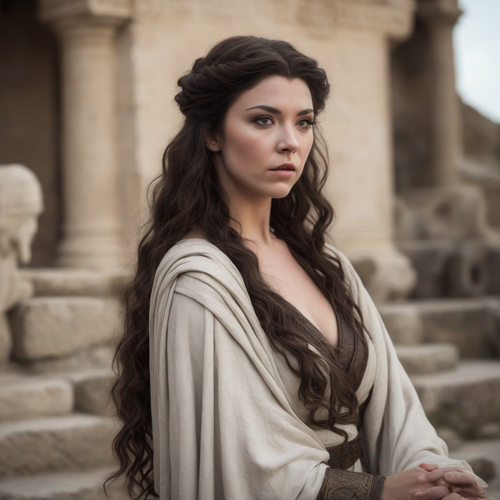

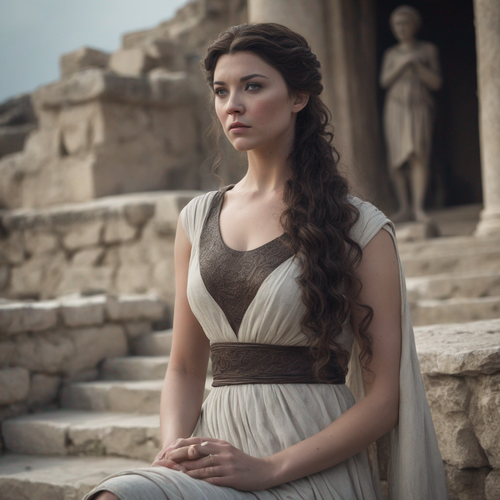

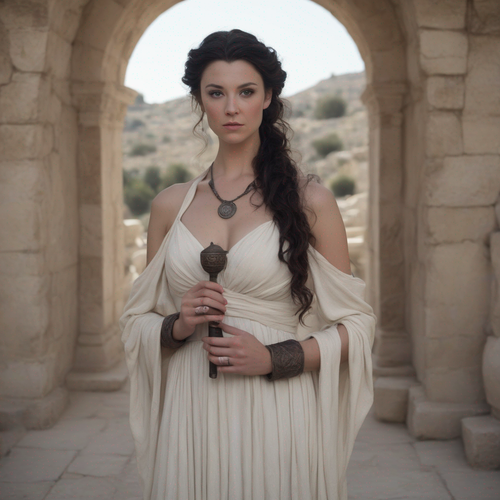

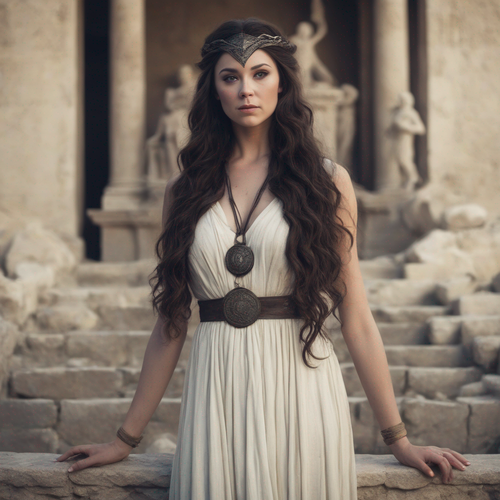

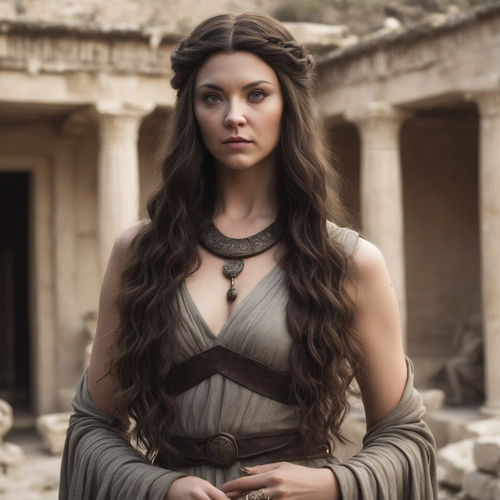

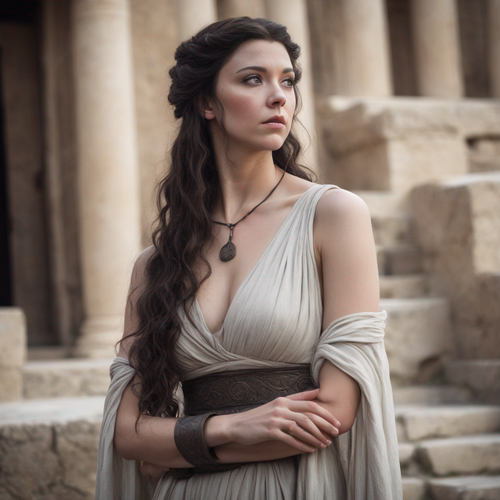

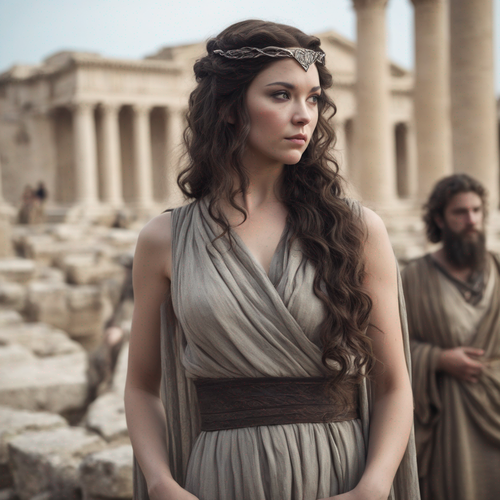

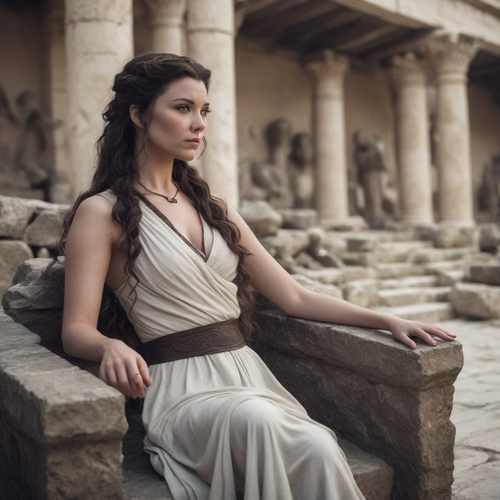

In [20]:
from PIL import Image
from IPython.display import display
import os

path = "/content/sks_woman3"

# Set the size to which you want to scale the images
width, height = 500, 500  # Example dimensions

for i in range(10):
    file_path = os.path.join(path, f'{i}.png')
    if os.path.exists(file_path):
        img = Image.open(file_path)
        img = img.resize((width, height), Image.ANTIALIAS)
        display(img)


In [21]:
!zip -r /content/sks_woman3.zip /content/sks_woman3

  adding: content/sks_woman3/ (stored 0%)
  adding: content/sks_woman3/6.png (deflated 0%)
  adding: content/sks_woman3/4.png (deflated 0%)
  adding: content/sks_woman3/3.png (deflated 0%)
  adding: content/sks_woman3/1.png (deflated 0%)
  adding: content/sks_woman3/7.png (deflated 0%)
  adding: content/sks_woman3/0.png (deflated 0%)
  adding: content/sks_woman3/5.png (deflated 0%)
  adding: content/sks_woman3/8.png (deflated 0%)
  adding: content/sks_woman3/9.png (deflated 0%)
  adding: content/sks_woman3/2.png (deflated 0%)
